# Image2text


##install

In [ ]:
!pip install torch==1.12.1

In [ ]:
!git clone https://github.com/salesforce/LAVIS
%cd LAVIS
!pip install .

##Examples

In [ ]:
import torch
from PIL import Image

from lavis.models import load_model_and_preprocess

#### Ex 1

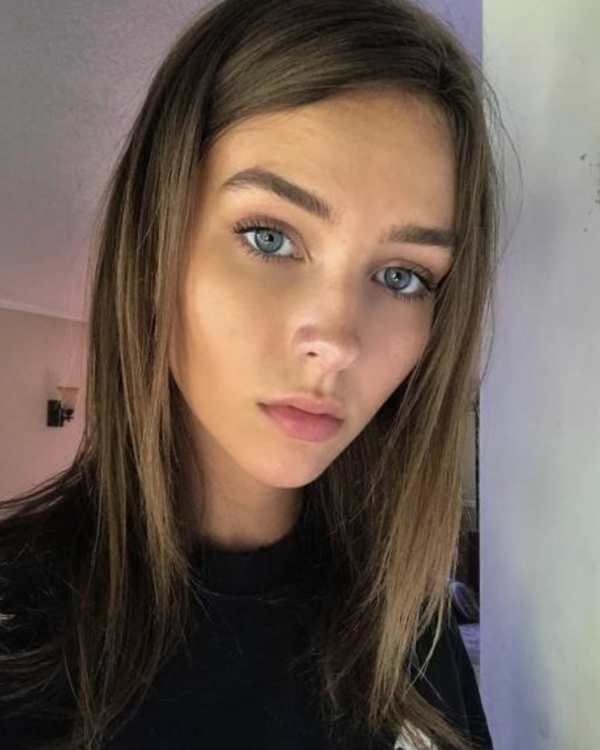

In [ ]:
#a girl with blue eyes posing for the camera
import requests

img_url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((600, 750)))

#### Ex 2

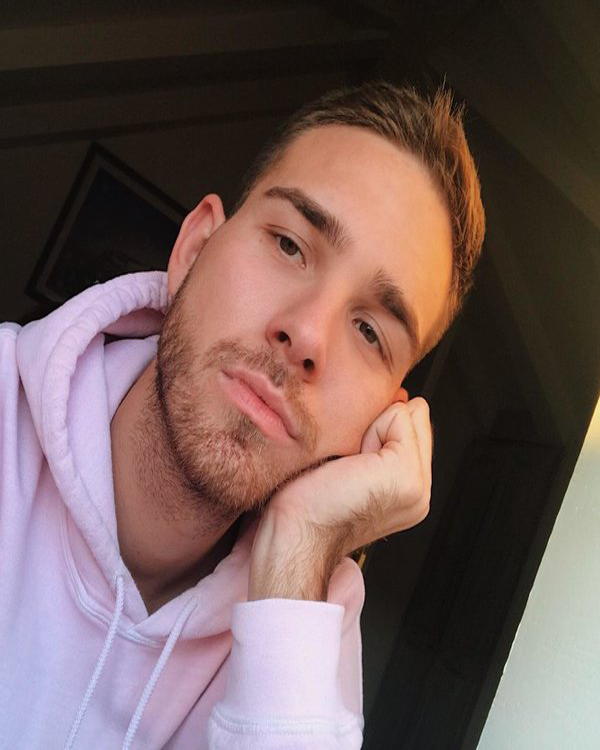

In [ ]:
#man in pink hoodie and white shirt posing for a picture
import requests

img_url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((600, 750)))

#### Ex 3

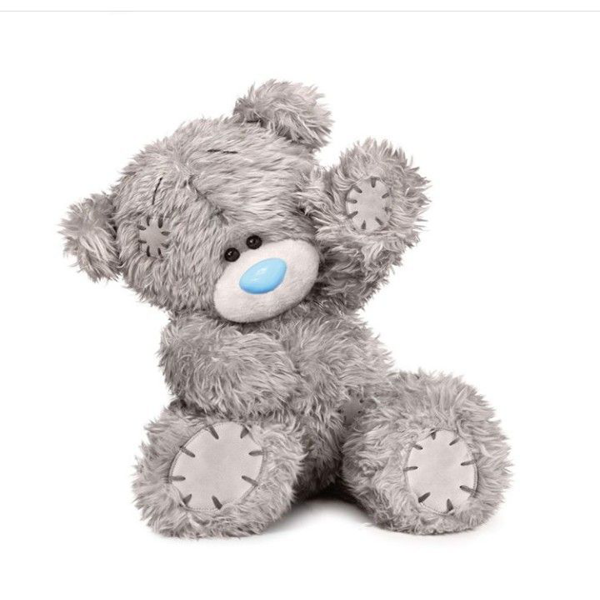

In [ ]:
import requests

img_url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((600, 600)))

#### Img to text

In [ ]:
# setup device to use
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# we associate a model with its preprocessors to make it easier for inference.
model, vis_processors, _ = load_model_and_preprocess(
    name="blip_caption", model_type="large_coco", is_eval=True, device=device
)

vis_processors.keys()

dict_keys(['train', 'eval'])

In [ ]:
image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)

In [ ]:
# due to the non-determinstic nature of necleus sampling, you may get different captions.
model.generate({"image": image}, use_nucleus_sampling=True, num_captions=4)

['a teddy bear holding a small blue pacifier',
 'a very cute furry teddy bear with a blue nose',
 'a grey teddy bear with a blue nose',
 'a teddy bear with a blue nose sits upright']

#What is in the photo

##install

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import torch
from PIL import Image
import requests

from lavis.models import load_model_and_preprocess

In [ ]:
import os
os.chdir("/content/gdrive/")
!ls

MyDrive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

##Matching the given style

###panda

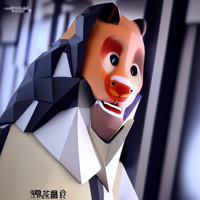

['no']

In [ ]:
#scala panda

init_image = Image.open('/content/gdrive/MyDrive/Project/scala_panda.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is there a panda here?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")
# ['no']

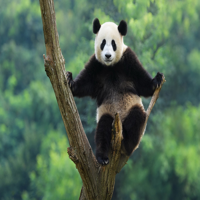

['yes']

In [ ]:
#photo with panda

img_url = "https://img5.goodfon.ru/wallpaper/nbig/c/d2/panda-medved-derevo-mishka-medvezhonok-fon-vetki-na-dereve.jpg"
init_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(init_image.resize((200, 200)))
init_image = init_image.resize((448, 448))

model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is there a panda here?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")
#['yes']

###girl_banksy

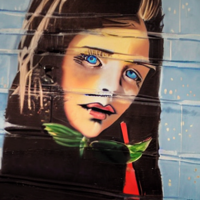

['van gogh']

In [ ]:
#girl_banksy In the style of which artist was this photo taken?

init_image = Image.open('/content/gdrive/MyDrive/Project/girl_banksy.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "In the style of which artist was this photo taken?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")
# ['no']

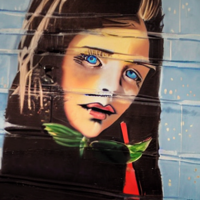

['yes']

In [ ]:
#girl_banksy Is this a Banksy style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/girl_banksy.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is this a Banksy style image?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

###girl_robert_delaunay

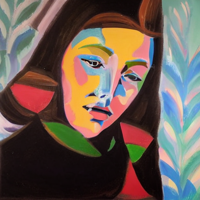

['picasso']

In [ ]:
#girl_robert_delaunay

init_image = Image.open('/content/gdrive/MyDrive/Project/girl_robert_delaunay.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "In the style of which artist was this photo taken?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

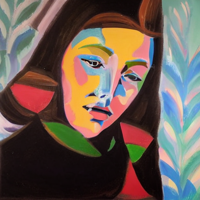

['yes']

In [ ]:
#girl_robert_delaunay Is this a Robert Delaunay style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/girl_robert_delaunay.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is this a Robert Delaunay style image?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

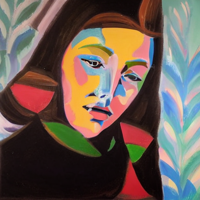

['no']

In [ ]:
#girl_robert_delaunay Is this a Banksy style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/girl_robert_delaunay.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is this a Banksy style image?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

###boy_malevich

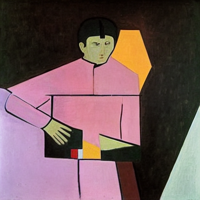

['picasso']

In [ ]:
#boy_malevich In the style of which artist was this photo taken?

init_image = Image.open('/content/gdrive/MyDrive/Project/boy_malevich.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "In the style of which artist was this photo taken?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

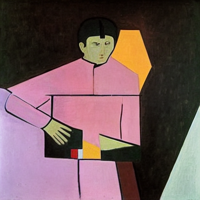

['yes']

In [ ]:
#boy_malevich "Is this a Malevich style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/boy_malevich.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Is this a Malevich style image?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

###squrrel_vincent_van_gogh

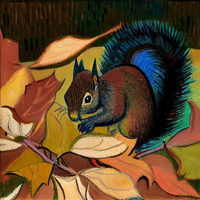

['monet']

In [ ]:
#squrrel_vincent_van_gogh In the style of which artist was this photo taken?

init_image = Image.open('/content/gdrive/MyDrive/Project/squrrel_vincent_van_gogh.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "In the style of which artist was this photo taken?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

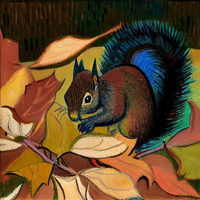

['yes']

In [ ]:
#squrrel_vincent_van_gogh.png Is this a Vincent Van Gogh style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/squrrel_vincent_van_gogh.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((200, 200)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Image in the style of Vincent Van Gogh?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

###cat 

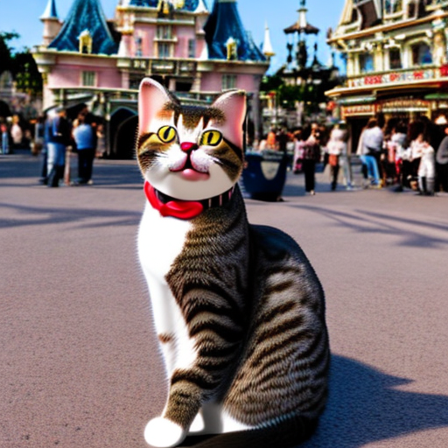

['disneyland']

In [ ]:
#cat_disneyland Is this a Vincent Van Gogh style image?

init_image = Image.open('/content/gdrive/MyDrive/Project/cat_disneyland.png').convert("RGB")
init_image = init_image.resize((448, 448))
display(init_image.resize((448, 448)))
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.
question = "Which city is this photo taken?"
image = vis_processors["eval"](init_image).unsqueeze(0).to(device)
question = txt_processors["eval"](question)
model.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

##matching the given image

###cat

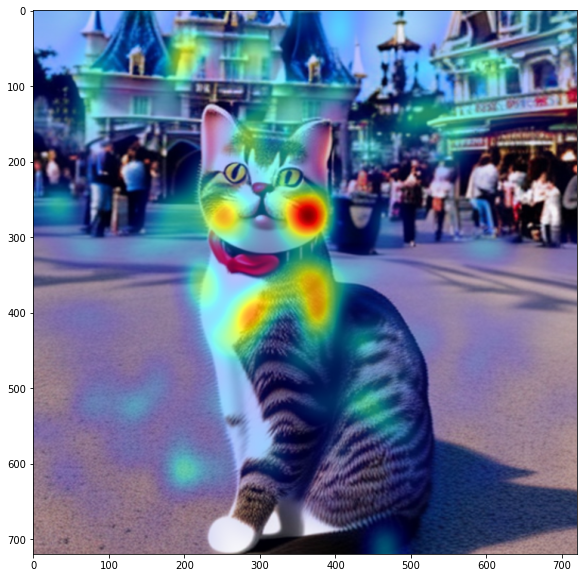

In [ ]:
init_image = Image.open('/content/gdrive/MyDrive/Project/cat_disneyland.png').convert("RGB")
caption = "a kitty in disneyland."
dst_w = 720
w, h = init_image.size
scaling_factor = dst_w / w

resized_img = init_image.resize((int(w * scaling_factor), int(h * scaling_factor)))
norm_img = np.float32(resized_img) / 255

img = vis_processors["eval"](init_image).unsqueeze(0).to(device)
txt = text_processors["eval"](caption)

#Compute GradCam
txt_tokens = model.tokenizer(txt, return_tensors="pt").to(device)
gradcam, _ = compute_gradcam(model, img, txt, txt_tokens, block_num=7)
#Average GradCam for the full image
avg_gradcam = getAttMap(norm_img, gradcam[0][1], blur=True)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(avg_gradcam)

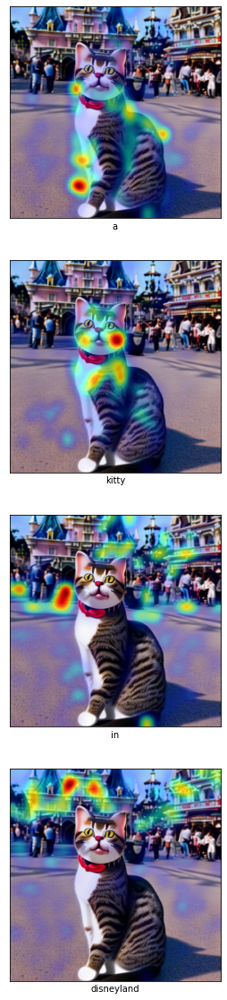

In [ ]:
num_image = len(txt_tokens.input_ids[0]) - 2
fig, ax = plt.subplots(num_image, 1, figsize=(15, 5 * num_image))

gradcam_iter = iter(gradcam[0][2:-1])
token_id_iter = iter(txt_tokens.input_ids[0][1:-1])

for i, (gradcam, token_id) in enumerate(zip(gradcam_iter, token_id_iter)):
    word = model.tokenizer.decode([token_id])
    gradcam_image = getAttMap(norm_img, gradcam, blur=True)
    ax[i].imshow(gradcam_image)
    ax[i].set_yticks([])
    ax[i].set_xticks([])
    ax[i].set_xlabel(word)

###boy_BANKSY

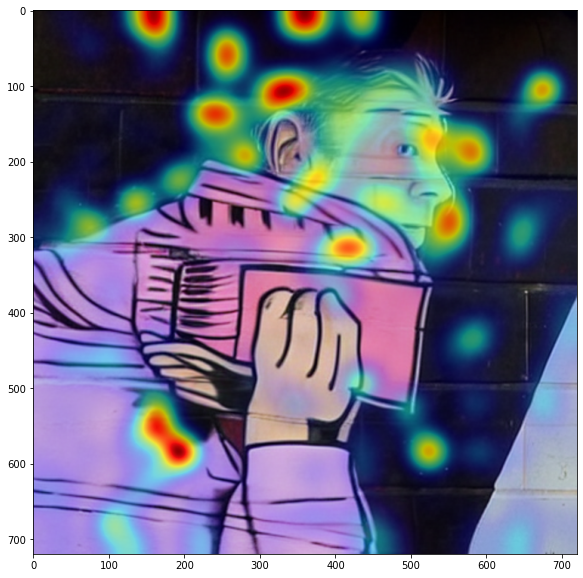

In [ ]:
init_image = Image.open('/content/gdrive/MyDrive/Project/boy_banksy.png').convert("RGB")
caption = "a BANKSY image boy."
dst_w = 720
w, h = init_image.size
scaling_factor = dst_w / w

resized_img = init_image.resize((int(w * scaling_factor), int(h * scaling_factor)))
norm_img = np.float32(resized_img) / 255

img = vis_processors["eval"](init_image).unsqueeze(0).to(device)
txt = text_processors["eval"](caption)

#Compute GradCam
txt_tokens = model.tokenizer(txt, return_tensors="pt").to(device)
gradcam, _ = compute_gradcam(model, img, txt, txt_tokens, block_num=7)
#Average GradCam for the full image
avg_gradcam = getAttMap(norm_img, gradcam[0][1], blur=True)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(avg_gradcam)

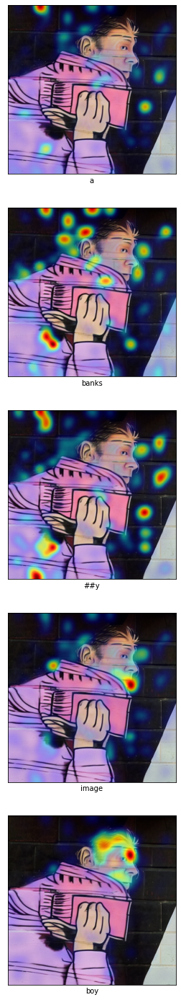

In [ ]:
num_image = len(txt_tokens.input_ids[0]) - 2
fig, ax = plt.subplots(num_image, 1, figsize=(15, 5 * num_image))

gradcam_iter = iter(gradcam[0][2:-1])
token_id_iter = iter(txt_tokens.input_ids[0][1:-1])

for i, (gradcam, token_id) in enumerate(zip(gradcam_iter, token_id_iter)):
    word = model.tokenizer.decode([token_id])
    gradcam_image = getAttMap(norm_img, gradcam, blur=True)
    ax[i].imshow(gradcam_image)
    ax[i].set_yticks([])
    ax[i].set_xticks([])
    ax[i].set_xlabel(word)

# Stable Diffusion - Img2Img 🎨

##install

In [ ]:
# make sure you are running in GPU
!nvidia-smi

In [ ]:
!pip install -U diffusers-interpret
!pip install matplotlib==3.1.3

### 0 - Login in HuggingFace's Hub

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

from huggingface_hub import notebook_login
notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


### 1 - Initialize `StableDiffusionImg2ImgPipeline` normally

In [ ]:
# make sure you're logged in by running the previous cell or `huggingface-cli login`
import torch
from contextlib import nullcontext
import requests
from PIL import Image
from io import BytesIO

from diffusers import StableDiffusionImg2ImgPipeline


device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    use_auth_token=True,
    
    # FP16 is not working for 'cpu'
    revision='fp16' if device != 'cpu' else None,
    torch_dtype=torch.float16 if device != 'cpu' else None
).to(device)
pipe.enable_attention_slicing() # comment this line if you wish to deactivate this option

### 2 - Pass `StableDiffusionImg2ImgPipeline` to `StableDiffusionImg2ImgPipelineExplainer`

In [ ]:
from diffusers_interpret import StableDiffusionImg2ImgPipelineExplainer

explainer = StableDiffusionImg2ImgPipelineExplainer(pipe, gradient_checkpointing=True)

#Example Scala 
##painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


###painting in the style of Banksy

  0%|          | 0/16 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


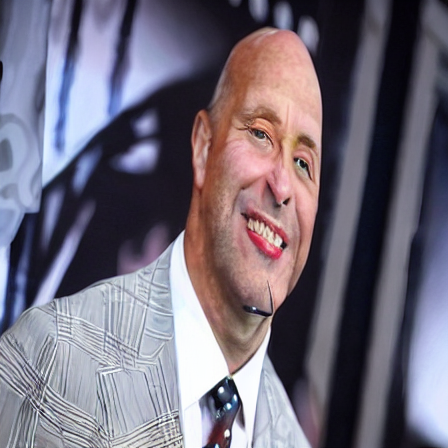

In [ ]:
prompt = "painting in the style of Banksy person, who is the founder of the company, speaks at a campaign event"

# let's download an initial image
#url = "https://cdnn21.img.ria.ru/images/149835/48/1498354822_0:66:3000:1754_1920x0_80_0_0_5bd29cd617576c8d05013b48eac43d3b.jpg"
#response = requests.get(url)
#init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")

init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.3, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

  0%|          | 0/31 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


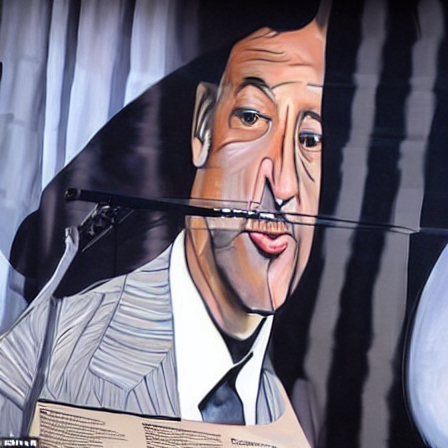

In [ ]:
init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.6, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

  0%|          | 0/43 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


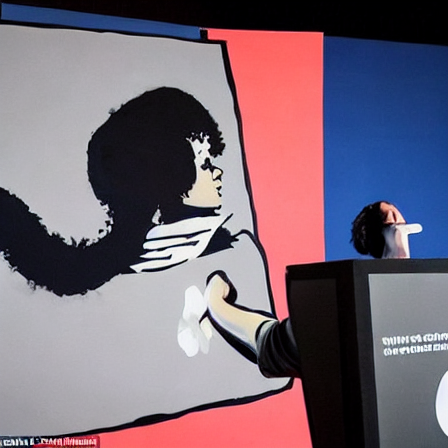

In [ ]:
init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.85, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/26 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


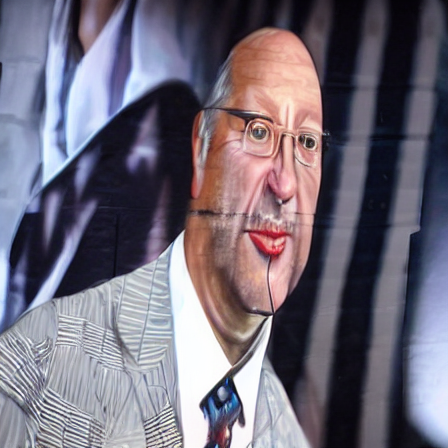

In [ ]:
prompt = "painting in the style of Pieter Cornelis person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.5, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/26 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


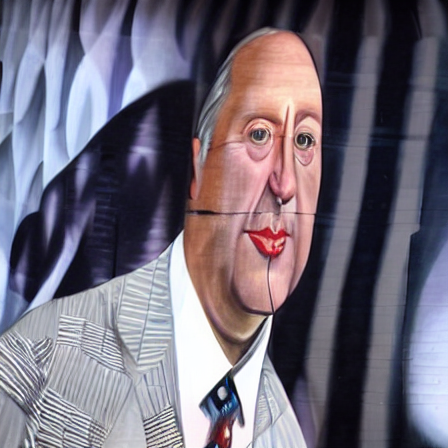

In [ ]:
prompt = "painting in the style of Robert Delaunay person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.5, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


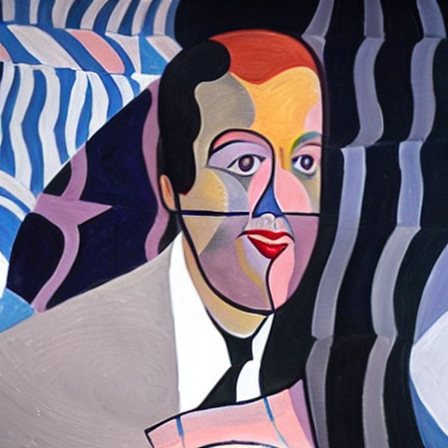

In [ ]:
prompt = "painting in the style of Robert Delaunay person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich 

  0%|          | 0/31 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


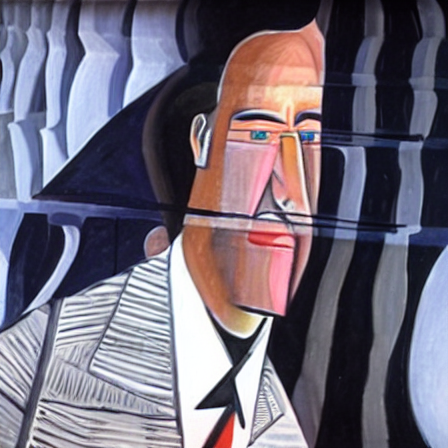

In [ ]:
prompt = "painting in the style of Malevich person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.6, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


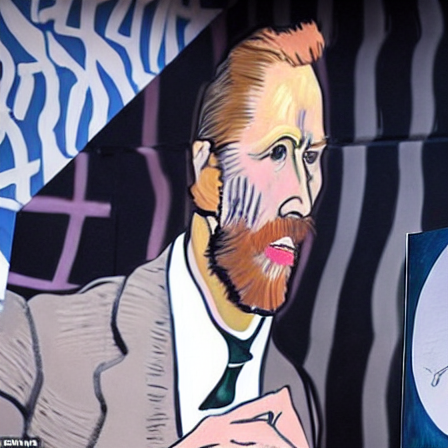

In [ ]:
prompt = "painting in the style of  Vincent Van Gogh person, who is the founder of the company, speaks at a campaign event"

init_image = Image.open('gdrive/My Drive/Project/scala.jpg').convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example Rita
##painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy photo girl with makeup

In [ ]:
prompt = "painting in the style of Banksy photo girl with makeup"

# let's download an initial image
url = "https://on-desktop.com/wps/2018Music_Beautiful_singer_Rita_Ora_photo_on_a_gray_background_129420_.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.75, guidance_scale=7.5, generator=generator
    )

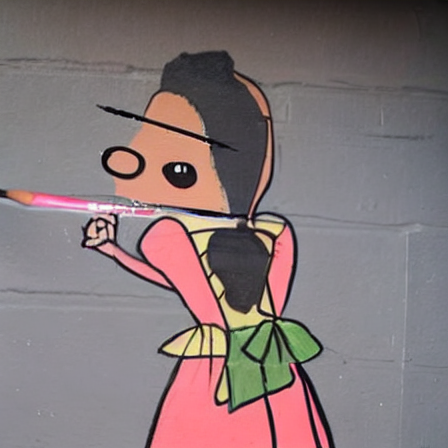

In [ ]:
# Final generated image 
output.image

In [ ]:
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, guidance_scale=0.5, generator=generator
    )

  0%|          | 0/41 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


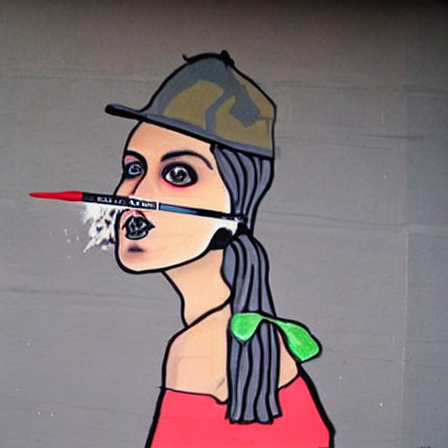

In [ ]:
# Final generated image 
output.image

###painting in the style of Pieter Cornelis photo girl with makeup

In [ ]:
prompt = "painting in the style of Pieter Cornelis photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


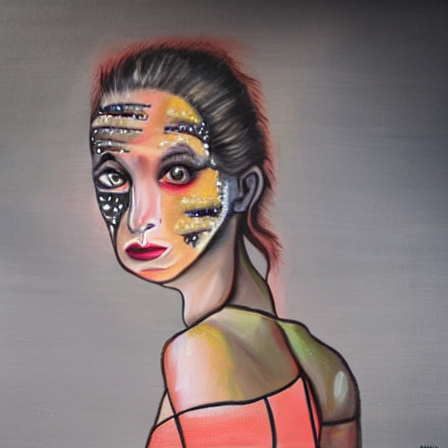

In [ ]:
# Final generated image 
output.image

###painting in the style of Robert Delaunay photo girl with makeup

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


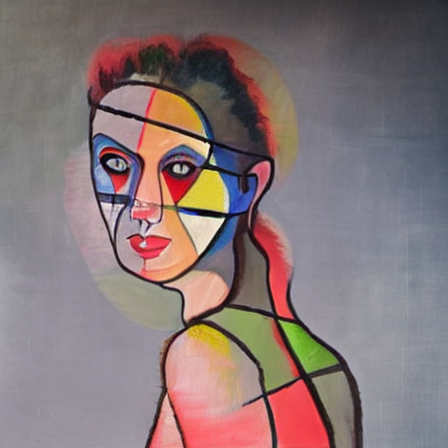

In [ ]:
prompt = "painting in the style of Robert Delaunay photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh photo girl with makeup

  0%|          | 0/41 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


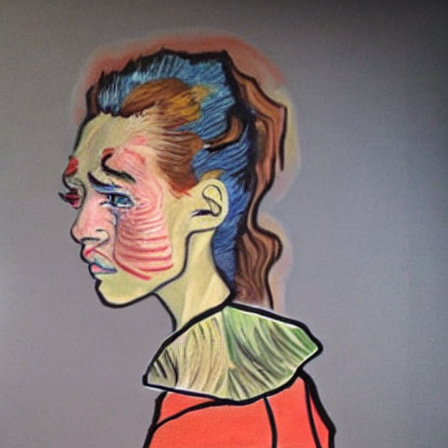

In [ ]:
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.8, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich photo girl with makeup

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


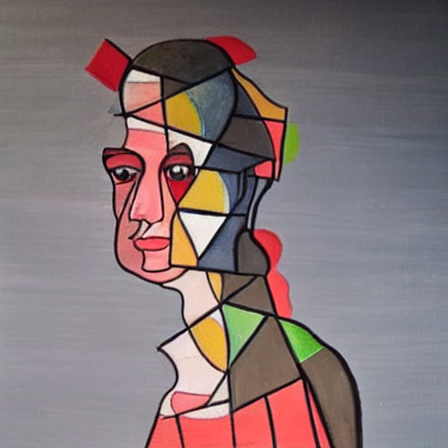

In [ ]:
prompt = "painting in the style of Malevich photo girl with makeup"
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image,strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

#Example boy 
##painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... 

/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:13: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())
/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:17: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())


Done!


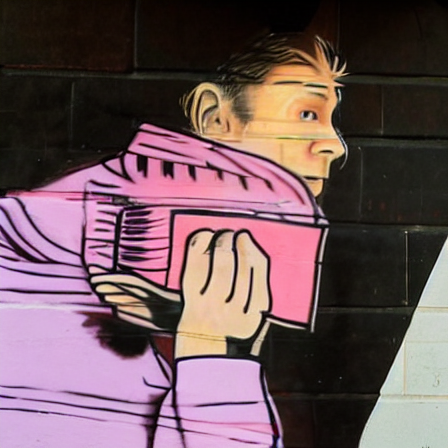

In [ ]:
prompt = 'painting in the style of Banksy photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


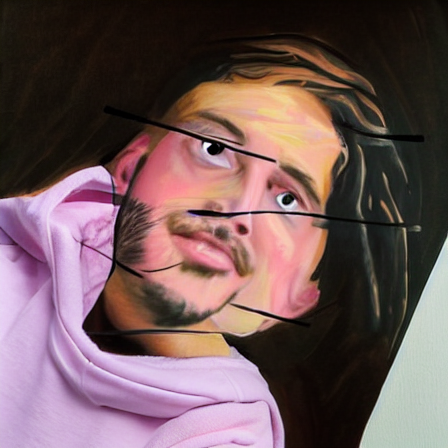

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


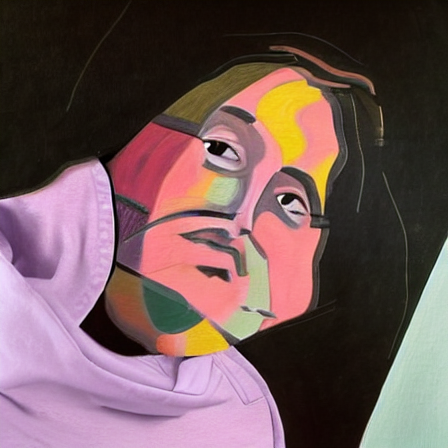

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


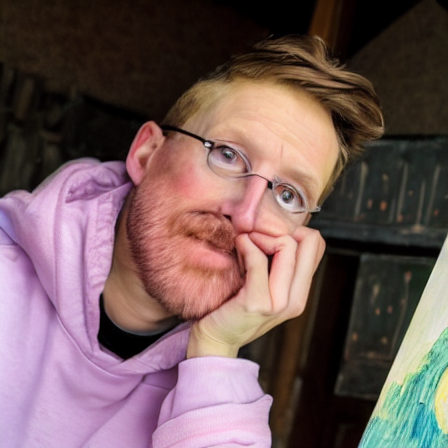

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


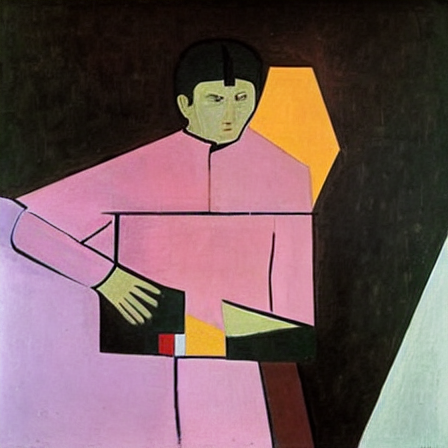

In [ ]:
prompt = 'painting in the style of Malevich photo man in pink hoodie and white shirt posing for a picture'

# let's download an initial image
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

##Example squirrel  
##painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


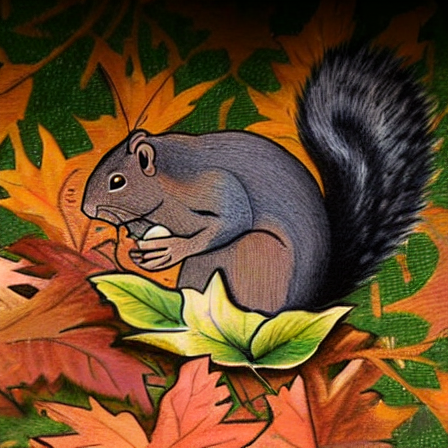

In [ ]:
prompt = 'painting in the style of Banksy photo a small brown and black squirrel standing on top of leaves'

# let's download an initial image
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


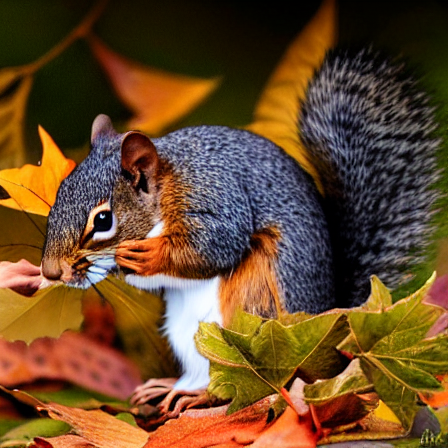

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a small brown and black squirrel standing on top of leaves'

# let's download an initial image
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


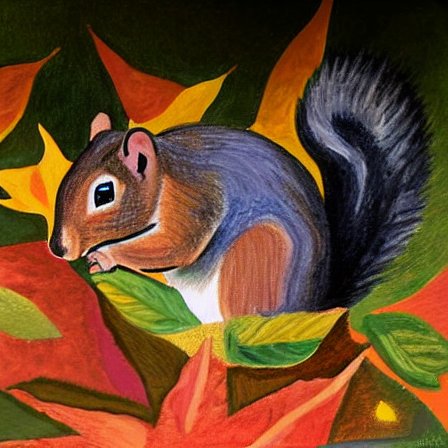

In [ ]:
prompt = 'painting in the style of Robert Delaunay a small brown and black squirrel standing on top of leaves'

# let's download an initial image
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


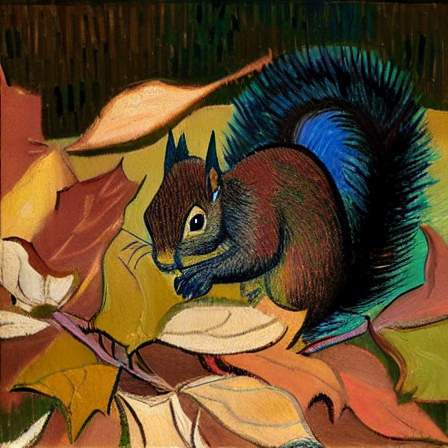

In [ ]:
prompt = 'SQURREL painting in the style of Vincent Van Gogh a small brown and black squirrel standing on top of leaves'

# let's download an initial image
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(4)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

##Example toy 
##painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... 

/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:13: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())
/usr/local/lib/python3.7/dist-packages/diffusers_interpret/pixel_attributions.py:17: RuntimeWarning: invalid value encountered in true_divide
  obj.normalized = 100 * (pixel_attributions / pixel_attributions.sum())


Done!


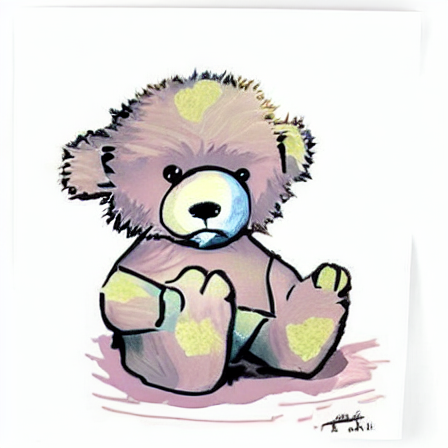

In [ ]:
prompt = 'painting in the style of Banksy on the wall photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


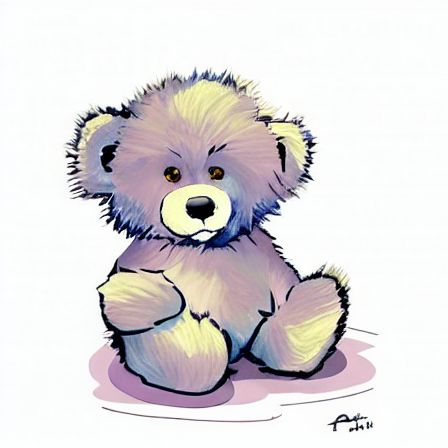

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.65, guidance_scale=7.5, generator=generator
    )

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


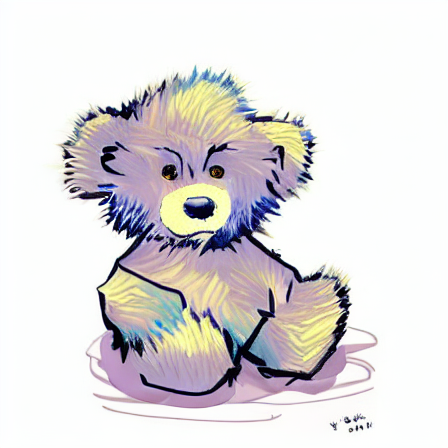

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"


response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


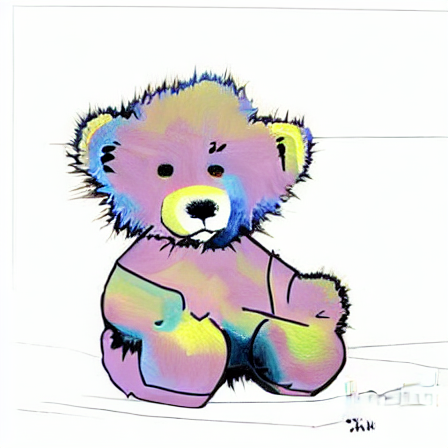

In [ ]:
prompt = 'painting in the style of Malevich photo a very cute furry teddy bear with a blue nose'

# let's download an initial image
url = "https://i.pinimg.com/736x/13/7c/50/137c50f6cffb025a6cf3d634e5a15834.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

# Example girl
painting in the style of Banksy, Pieter Cornelis, Robert Delaunay, Malevich, Vincent Van Gogh

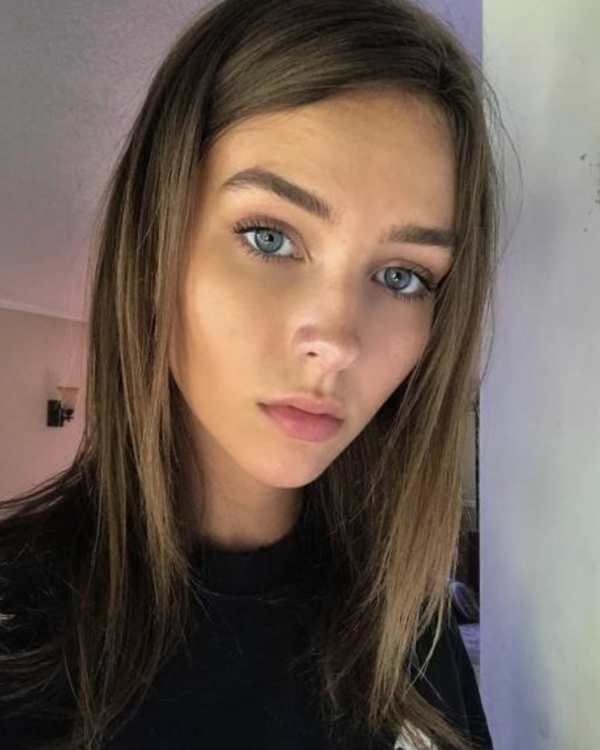

In [ ]:
#a girl with blue eyes posing for the camera
import requests

img_url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((600, 750)))

###painting in the style of Banksy

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


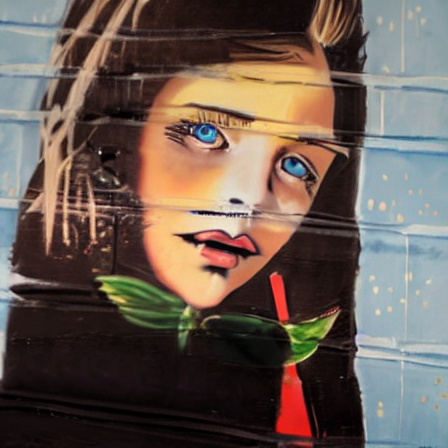

In [ ]:
prompt = 'painting in the style of Banksy photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Pieter Cornelis

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


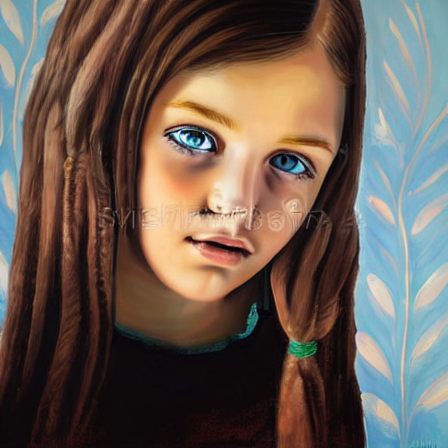

In [ ]:
prompt = 'painting in the style of Pieter Cornelis photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((448, 448))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Robert Delaunay

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


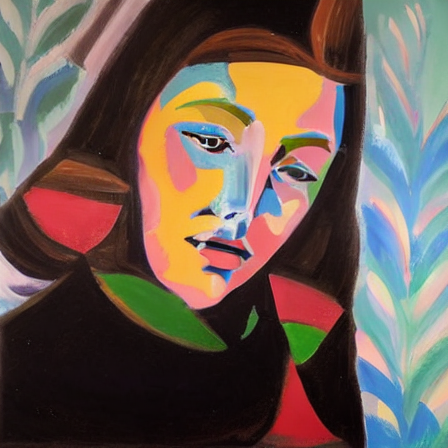

In [ ]:
prompt = 'painting in the style of Robert Delaunay photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((512, 512))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Vincent Van Gogh

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


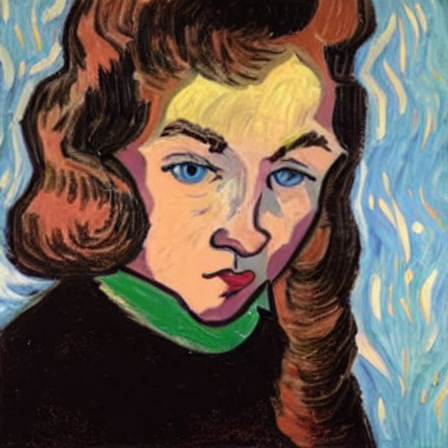

In [ ]:
prompt = 'painting in the style of Vincent Van Gogh photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((512, 512))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image

###painting in the style of Malevich

  0%|          | 0/36 [00:00<?, ?it/s]

Calculating token and image pixel attributions... Done!


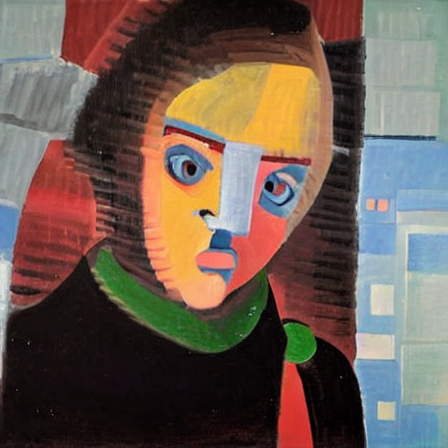

In [ ]:
prompt = 'painting in the style of Malevich photo a girl with blue eyes posing for the camera'

# let's download an initial image
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg"

response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((512, 512))

generator = torch.Generator(device).manual_seed(42)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt=prompt, init_image=init_image, strength=0.7, guidance_scale=7.5, generator=generator
    )
# Final generated image 
output.image